# SCENIC Protocol

In [2]:
# load packages
import sys
import scanpy as sc
import pandas as pd
import seaborn as sns
import numpy as np
import os, glob, re, pickle
import loompy
import anndata as ad
import matplotlib as mpl
import matplotlib.pyplot as plt

from functools import partial
from collections import OrderedDict
import operator as op
from cytoolz import compose

from arboreto.utils import load_tf_names
from arboreto.algo import grnboost2

from pyscenic.export import export2loom, add_scenic_metadata
from pyscenic.utils import load_motifs, modules_from_adjacencies
from pyscenic.aucell import aucell
from pyscenic.binarization import binarize
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_binarization, plot_rss
from pyscenic.rnkdb import FeatherRankingDatabase as RankingDatabase
from pyscenic.prune import prune2df, df2regulons, _distributed_calc
from pyscenic.cli.utils import load_signatures

from dask.diagnostics import ProgressBar
from distributed import LocalCluster, Client
import logging

from IPython.display import HTML, display

In [3]:
#check if correct kernel is loaded
sys.executable

'/home/yilin/anaconda3/envs/scenic_protocol/bin/python'

In [3]:
# Set maximum number of jobs for Scanpy.
sc.settings.njobs = 32

In [4]:
sc.set_figure_params(dpi=80)

Folder structure.

In [5]:
# download motifs tables
#!wget https://resources.aertslab.org/cistarget/motif2tf/motifs-v9-nr.hgnc-m0.001-o0.0.tbl -P /home/yilin/SCENIC_Files

In [7]:
#location to store motifs and transcription factor tables/lists
AUXILLIARIES_FOLDERNAME = "/home/yilin/SCENIC_Files"
#output directory
RESULTS_FOLDERNAME = "../PCA/results"
FIGURES_FOLDERNAME = "../PCA/figures"

In [8]:
sc.settings.figdir = FIGURES_FOLDERNAME

Auxilliary functions.

In [9]:
BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

In [10]:
def savesvg(fname: str, fig, folder: str=FIGURES_FOLDERNAME) -> None:
    """
    Save figure as vector-based SVG image format.
    """
    fig.tight_layout()
    fig.savefig(os.path.join(folder, fname), format='svg')

In [11]:
def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', -1)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

Auxilliary data sets.

In [12]:
# Downloaded fromm pySCENIC github repo: https://github.com/aertslab/pySCENIC/tree/master/resources
HUMAN_TFS_FNAME = os.path.join(AUXILLIARIES_FOLDERNAME, 'lambert2018.txt')
# Ranking databases. Downloaded from cisTargetDB: https://resources.aertslab.org/cistarget/
RANKING_DBS_FNAMES = list(map(lambda fn: os.path.join(AUXILLIARIES_FOLDERNAME, fn),
                       ['hg19-500bp-upstream-10species.mc9nr.feather',
                       'hg19-tss-centered-5kb-10species.mc9nr.feather',
                        'hg19-tss-centered-10kb-10species.mc9nr.feather']))
# Motif annotations. Downloaded from cisTargetDB: https://resources.aertslab.org/cistarget/
MOTIF_ANNOTATIONS_FNAME = os.path.join(AUXILLIARIES_FOLDERNAME, 'motifs-v9-nr.hgnc-m0.001-o0.0.tbl')

In [13]:
# download motifs tables
#!wget https://resources.aertslab.org/cistarget/motif2tf/motifs-v9-nr.hgnc-m0.001-o0.0.tbl -P /home/yilin/SCENIC_Files

In [14]:
DATASET_ID = "epi"

Results created.

In [15]:
ANNDATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.h5ad'.format(DATASET_ID))
EXP_MTX_QC_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.qc.tpm.csv'.format(DATASET_ID))
ADJACENCIES_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.adjacencies.tsv'.format(DATASET_ID))
MOTIFS_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.motifs.csv'.format(DATASET_ID))
REGULONS_DAT_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.regulons.dat'.format(DATASET_ID))
AUCELL_MTX_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.auc.csv'.format(DATASET_ID))
ANNDATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.h5ad'.format(DATASET_ID))

### STEP 0: Preprocessing

__METADATA CLEANING__

__EXPRESSION MATRIX QC__

In [16]:
adata = sc.read_h5ad("/home/yilin/Dropbox (VU Basic Sciences)/yilin/PCA/epi.h5ad")
#0.5% cells
sc.pp.filter_genes(adata,min_cells=115)
adata.raw = adata

In [17]:
adata

AnnData object with n_obs × n_vars = 22985 × 16319
    obs: 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'label'
    var: 'Mitochondrial', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std', 'n_cells'
    uns: 'batch_colors', 'label_colors', 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [27]:
adata.write_h5ad(ANNDATA_FNAME,compression='gzip')
adata.to_df().to_csv(EXP_MTX_QC_FNAME)

### STEP 1: Network inference based on GRNBoost2

_Output:_ List of adjacencies between a TF and its targets stored in `ADJACENCIES_FNAME`.

In [29]:
# load tf info into environment
tf_names = load_tf_names(HUMAN_TFS_FNAME)

In [40]:
# read data in as data frame, set type to a 16 bit int to save memory, signed int16s have a max value of 32,767
data = adata.to_df().astype('int16')

In [30]:
# set up dask cluster
# set proper port forwarding during ssh connection to forward the dashboard address to a local address
local_cluster = LocalCluster(n_workers=4,threads_per_worker=6,dashboard_address='localhost:5757',memory_limit='16GB')
custom_client_coexp =  Client(local_cluster)

In [32]:
# access the dask dashboard with http://127.0.0.1:port/status to track the progress
custom_client_coexp

Client Scheduler: tcp://127.0.0.1:33319 Dashboard: http://127.0.0.1:5757/status,Cluster Workers: 4 Cores: 24 Memory: 64.00 GB


In [ ]:
adj = grnboost2(data, tf_names=tf_names, verbose=True,client_or_address=custom_client_coexp)

preparing dask client
parsing input
creating dask graph
4 partitions
computing dask graph


In [33]:
#close cluster
local_cluster.close()
custom_client_coexp.close()

In [ ]:
#save results in ADJACENCIES_FNAME
adj.to_csv(ADJACENCIES_FNAME, index=False, sep='\t')

#### Run grnboost2 from CLI

For this step the CLI version of pySCENIC is used

In [ ]:
!pyscenic grn {EXP_MTX_QC_FNAME} {HUMAN_TFS_FNAME} -o {ADJACENCIES_FNAME} --num_workers 24

```
2019-04-25 11:22:20,360 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.
2019-04-25 11:23:37,612 - pyscenic.cli.pyscenic - INFO - Inferring regulatory networks.
preparing dask client
parsing input
creating dask graph
4 partitions
computing dask graph
not shutting down client, client was created externally
finished
2019-04-26 03:58:01,096 - pyscenic.cli.pyscenic - INFO - Writing results to file.
```

### STEP 2-3: Regulon prediction aka cisTarget

_Output:_ List of adjacencies between a TF and its targets stored in `MOTIFS_FNAME`.

#### Regulon prediction from CLI
For this step the CLI version of pySCENIC is used

In [18]:
DBS_PARAM = ' '.join(RANKING_DBS_FNAMES)
DBS_PARAM #shows the 3 databased loaded

'/home/yilin/SCENIC_Files/hg19-500bp-upstream-10species.mc9nr.feather /home/yilin/SCENIC_Files/hg19-tss-centered-5kb-10species.mc9nr.feather /home/yilin/SCENIC_Files/hg19-tss-centered-10kb-10species.mc9nr.feather'

In [ ]:
!pyscenic ctx {ADJACENCIES_FNAME} {DBS_PARAM} \
            --annotations_fname {MOTIF_ANNOTATIONS_FNAME} \
            --expression_mtx_fname {EXP_MTX_QC_FNAME} \
            --output {MOTIFS_FNAME} \
            --num_workers 24

```
2019-04-26 10:23:50,395 - pyscenic.cli.pyscenic - INFO - Creating modules.
2019-04-26 10:23:56,229 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.
2019-04-26 10:29:09,101 - pyscenic.cli.pyscenic - INFO - Loading databases.
2019-04-26 10:29:09,101 - pyscenic.cli.pyscenic - INFO - Calculating regulons.
2019-04-26 11:11:10,784 - pyscenic.cli.pyscenic - INFO - Writing results to file
```

The results is a list of enriched motifs for the modules.

| Column name | Description |
| ----------- | ----------- |
| TF | Transcription Factor (TF) for which an enriched motif is discovered. |
| motifID | The identifier of the enriched motif. |
| AUC | Area Under the recovery Curve statistic for this enriched motif. |
| NES | Normalized Enrichment Score for this enriched motif. |
| Context | Collection of tags clarifying the origin of the module for this factor: e.g. ranking database, ... |
| Annotation | Verbose description of the annotation available for this motif. |
| MotifSimilarityQvalue | The TomTom derived Q-value for motif similarity (if used for assigning the factor to this enriched motif). |
| OrthologousIdentity | The Amino Acid Identity between factors (if used for assigning the factor to this enriched motif). |
| RankAtMax | The position of the Leading Edge which is used as a threshold on the whole genome ranking of the motif to decide if a gene in the input is a direct target of a TF that binds this motif. |
| TargetGenes | A list of pairs: genes and their associated weights from GENIE3/GRNBoost2. |

In [34]:
df_motifs = load_motifs(MOTIFS_FNAME)

In [35]:
df_motifs.shape

(33651, 8)

In [36]:
df_motifs.columns

MultiIndex([('Enrichment',                   'AUC'),
            ('Enrichment',                   'NES'),
            ('Enrichment', 'MotifSimilarityQvalue'),
            ('Enrichment',   'OrthologousIdentity'),
            ('Enrichment',            'Annotation'),
            ('Enrichment',               'Context'),
            ('Enrichment',           'TargetGenes'),
            ('Enrichment',             'RankAtMax')],
           )

In [37]:
df_motifs.head()

Enrichment            \
                                              AUC       NES   
TF   MotifID                                                  
ATF3 dbcorrdb__ATF3__ENCSR000BNU_1__m1   0.053942  3.042474   
ATF6 transfac_pro__M07693                0.041249  3.111575   
     cisbp__M0359                        0.041190  3.100026   
     transfac_pro__M09530                0.041466  3.154034   
     cisbp__M0284                        0.040937  3.050527   

                                                              \
                                       MotifSimilarityQvalue   
TF   MotifID                                                   
ATF3 dbcorrdb__ATF3__ENCSR000BNU_1__m1              0.000000   
ATF6 transfac_pro__M07693                           0.000735   
     cisbp__M0359                                   0.000130   
     transfac_pro__M09530                           0.000006   
     cisbp__M0284                                   0.000163   

                                                            \
                                       OrthologousIdentity   
TF   MotifID                                                 
ATF3 dbcorrdb__ATF3__ENCSR000BNU_1__m1                 1.0   
ATF6 transfac_pro__M07693                              1.0   
     cisbp__M0359                                      1.0   
     transfac_pro__M09530                              1.0   
     cisbp__M0284                                      1.0   

                                                                                           \
                                                                               Annotation   
TF   MotifID                                                                                
ATF3 dbcorrdb__ATF3__ENCSR000BNU_1__m1                         gene is directly annotated   
ATF6 transfac_pro__M07693               motif similar to taipale_cyt_meth__ATF6_NGRTGA...   
     cisbp__M0359                       motif similar to taipale_cyt_meth__ATF6_NGRTGA...   
     transfac_pro__M09530               motif similar to taipale_cyt_meth__ATF6_NGRTGA...   
     cisbp__M0284                       motif similar to taipale_cyt_meth__ATF6_NGRTGA...   

                                                                                           \
                                                                                  Context   
TF   MotifID                                                                                
ATF3 dbcorrdb__ATF3__ENCSR000BNU_1__m1  (hg19-500bp-upstream-10species.mc9nr, activati...   
ATF6 transfac_pro__M07693               (hg19-500bp-upstream-10species.mc9nr, activati...   
     cisbp__M0359                       (hg19-500bp-upstream-10species.mc9nr, activati...   
     transfac_pro__M09530               (hg19-500bp-upstream-10species.mc9nr, activati...   
     cisbp__M0284                       (hg19-500bp-upstream-10species.mc9nr, activati...   

                                                                                           \
                                                                              TargetGenes   
TF   MotifID                                                                                
ATF3 dbcorrdb__ATF3__ENCSR000BNU_1__m1  [(TMEM37, 7.775714442207729), (FGL2, 0.8772781...   
ATF6 transfac_pro__M07693               [(TPT1, 1.159416027617437), (FKBP11, 0.4025415...   
     cisbp__M0359                       [(FKBP11, 0.4025415914362542), (UBE2B, 1.25156...   
     transfac_pro__M09530               [(FKBP11, 0.4025415914362542), (SLC30A5, 0.782...   
     cisbp__M0284                       [(UBE2B, 1.2515603861548712), (TPT1, 1.1594160...   

                                                  
                                       RankAtMax  
TF   MotifID                                      
ATF3 dbcorrdb__ATF3__ENCSR000BNU_1__m1       947  
ATF6 transfac_pro__M07693                   1057  
     cisbp__M0359                 

Display the enriched motifs with their associated sequence logos.

In [38]:
display_logos(df_motifs.head())

/home/yilin/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.


### STEP 4: Cellular enrichment aka AUCell

__REGULON CREATION__

Regulons can easily be created from this list of enriched motifs via `pyscenic.transform.df2regulons`. Here we provide an auxilliary function to carefully select the enriched motifs that contribute to the regulons.

In [18]:
def derive_regulons(motifs, db_names=('hg19-tss-centered-10kb-10species.mc9nr', 
                                 'hg19-500bp-upstream-10species.mc9nr', 
                                 'hg19-tss-centered-5kb-10species.mc9nr')):
    motifs.columns = motifs.columns.droplevel(0)

    def contains(*elems):
        def f(context):
            return any(elem in context for elem in elems)
        return f

    # For the creation of regulons we only keep the 10-species databases and the activating modules. We also remove the
    # enriched motifs for the modules that were created using the method 'weight>50.0%' (because these modules are not part
    # of the default settings of modules_from_adjacencies anymore.
    #motifs = motifs[
      #  np.fromiter(map(compose(op.not_, contains('weight>50.0%')), motifs.Context), dtype=np.bool) & \
       # np.fromiter(map(contains(*db_names), motifs.Context), dtype=np.bool) & \
       # np.fromiter(map(contains('activating'), motifs.Context), dtype=np.bool)]

    # We build regulons only using enriched motifs with a NES of 3.0 or higher; we take only directly annotated TFs or TF annotated
    # for an orthologous gene into account; and we only keep regulons with at least 10 genes.
    regulons = list(filter(lambda r: len(r) >= 10, df2regulons(motifs[(motifs['NES'] >= 3.0) 
                                                                      & ((motifs['Annotation'] == 'gene is directly annotated')
                                                                        | (motifs['Annotation'].str.startswith('gene is orthologous to')
                                                                           & motifs['Annotation'].str.endswith('which is directly annotated for motif')))
                                                                     ])))
    
    # Rename regulons, i.e. remove suffix.
    return list(map(lambda r: r.rename(r.transcription_factor), regulons))

In [19]:
df_motifs = load_motifs(MOTIFS_FNAME)
regulons_new = derive_regulons(df_motifs)
len(regulons_new)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


137

In [20]:
regulons_epi_new = [reg.name for reg in regulons_new]
pd.DataFrame(regulons_epi_new).to_csv('results/regulons_new.csv')

#### generate regulons via `pyscenic.transform.df2regulons`

In [29]:
df_motifs = load_motifs(MOTIFS_FNAME)
regulons = df2regulons(df_motifs)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [30]:
len(regulons)

233

In [33]:
# Pickle these regulons.
with open(REGULONS_DAT_FNAME, 'wb') as f:
    pickle.dump(regulons, f)

In [4]:
from pyscenic.cli.utils import load_signatures
regulons = load_signatures(REGULONS_DAT_FNAME)

#### __AUCELL__

In [41]:
%%time
auc_mtx = aucell(adata.to_df(), regulons, num_workers=24)
auc_mtx.to_csv(AUCELL_MTX_FNAME)

CPU times: user 15.4 s, sys: 5.23 s, total: 20.6 s
Wall time: 30.9 s


In [42]:
auc_mtx

Regulon,AHRR(+),ARNTL2(+),ARX(+),ATF3(+),ATF4(+),ATF6(+),ATF7(+),ATOH1(+),BACH1(+),BACH2(+),...,ZNF415(+),ZNF420(+),ZNF449(+),ZNF597(+),ZNF655(+),ZNF76(+),ZNF776(+),ZNF805(+),ZNF841(+),ZXDB(+)
Cell,,,,,,,,,,,,,,,,,,,,,
GAGGGAGGTAATGAAGCA-6412-YX-20,0.020745,0.024508,0.011215,0.031978,0.091126,0.013074,0.000000,0.009746,0.027112,0.0,...,0.044317,0.002005,0.0,0.003183,0.0,0.020406,0.00000,0.022047,0.000000,0.000000
TGATTCACATAATATGCAT-6412-YX-20,0.017869,0.013821,0.005491,0.011783,0.108881,0.014238,0.008004,0.030009,0.029276,0.0,...,0.000000,0.012297,0.0,0.044183,0.0,0.008002,0.00000,0.037847,0.000000,0.000000
AGGTGACACAGAAGTTA-6412-YX-20,0.000000,0.037383,0.010836,0.024373,0.089714,0.010821,0.010266,0.008707,0.029702,0.0,...,0.000000,0.025173,0.0,0.000000,0.0,0.004005,0.00000,0.026693,0.000000,0.000000
AAAACTCGAAAATCAGA-6412-YX-20,0.000000,0.010886,0.012344,0.043045,0.077166,0.024068,0.000000,0.000000,0.012336,0.0,...,0.000000,0.000000,0.0,0.000000,0.0,0.017886,0.00000,0.027090,0.000000,0.287109
AGAAGTCCACCCATAT-6412-YX-20,0.000000,0.030789,0.004835,0.028823,0.096037,0.016374,0.013598,0.000000,0.032262,0.0,...,0.009782,0.024950,0.0,0.000000,0.0,0.000000,0.00000,0.038623,0.000000,0.105021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ACAACGTGGCAACGTGG-6412-YX-13,0.000000,0.020458,0.006120,0.022376,0.068365,0.018292,0.003185,0.011412,0.017007,0.0,...,0.000000,0.000000,0.0,0.043979,0.0,0.004718,0.00000,0.065252,0.125310,0.003042
GAACTAGGATACCACGCT-6412-YX-13,0.000000,0.000000,0.005988,0.022487,0.070039,0.024985,0.011539,0.285506,0.026653,0.0,...,0.000000,0.030029,0.0,0.048543,0.0,0.011699,0.00000,0.070417,0.021322,0.000000
AAAACCTCCTTCGCTGG-6412-YX-13,0.000000,0.000671,0.023601,0.033339,0.095155,0.021261,0.014696,0.094608,0.026376,0.0,...,0.000000,0.000000,0.0,0.000000,0.0,0.006278,0.28288,0.016716,0.036702,0.006571


```
CPU times: user 23.1 s, sys: 10.7 s, total: 33.8 s
Wall time: 39.2 s
```

In [43]:
auc_mtx = pd.read_csv(AUCELL_MTX_FNAME, index_col=0

In [44]:
auc = sc.read_csv(AUCELL_MTX_FNAME)

In [45]:
auc.write_h5ad('auc_epi.h5ad',compression='gzip')

In [34]:
auc = sc.read_h5ad('auc_epi.h5ad')

In [35]:
sc.pp.scale(auc)
sc.pp.pca(auc,random_state=0)
neighborhood_k = np.sqrt(auc.n_obs).astype(int) #We have found that scaling the K to equal the square root of the total number of neighbors to be effective
sc.pp.neighbors(auc,n_neighbors=neighborhood_k,use_rep='X_pca',random_state=0) #Calculate this KNN based off of the PCA distances
sc.tl.umap(auc,min_dist=0.25,random_state=0)
sc.tl.leiden(auc,resolution=2,random_state=0) #Here we use a resolution of 2, which should yield 30+ clusters. This step may take a while.

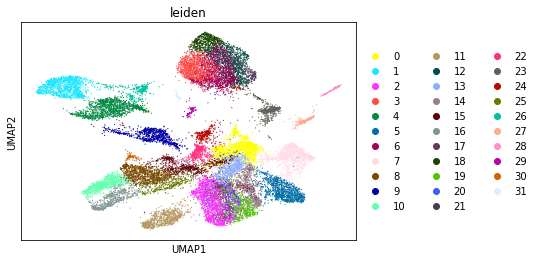

In [36]:
sc.pp.normalize_total(adata) #Normalize data by the median counts per single cell library
adata.X = np.arcsinh(adata.X).copy() #Transform the data by using an inverse hyperbolic sine transform, this eliminates the need for adding a pseudocount 
sc.pp.scale(adata)
sc.pp.pca(adata,random_state=0)
neighborhood_k = np.sqrt(adata.n_obs).astype(int) #We have found that scaling the K to equal the square root of the total number of neighbors to be effective
sc.pp.neighbors(adata,n_neighbors=neighborhood_k,use_rep='X_pca',random_state=0) #Calculate this KNN based off of the PCA distances
sc.tl.umap(adata,min_dist=0.25,random_state=0)
sc.tl.leiden(adata,resolution=2,random_state=0) #Here we use a resolution of 2, which should yield 30+ clusters. This step may take a while.
sc.pl.umap(adata,color=['leiden'],use_raw=False,cmap='viridis')

In [37]:
pd.DataFrame(auc.obsm['X_umap']).to_csv("results/X_umap_aucell.csv")
pd.DataFrame(adata.obsm['X_umap']).to_csv("results/X_umap_adata.csv")

In [38]:
adata2 = adata.copy()
adata2.obsm['X_umap'] = auc.obsm['X_umap']
adata2.obs['leiden'] = auc.obs['leiden']

In [39]:
pd.DataFrame(adata2.obs['leiden']).to_csv('leiden.csv')

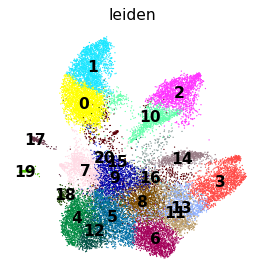

In [55]:
sc.pl.umap(adata2,color=['leiden'],use_raw=False,cmap='tab20b',legend_loc='on data',save='umap.png',frameon=False)

In [52]:
adata2.obs['cell_type']= 'NA'
adata2.obs['cell_type'][adata2.obs.leiden=='14'] = 'CT'
adata2.obs['cell_type'][np.isin(adata2.obs.leiden,['2','10'])] = 'ABS'
adata2.obs['cell_type'][adata2.obs.leiden=='17'] = 'TUF'
adata2.obs['cell_type'][np.isin(adata2.obs.leiden,['0','1'])] = 'GOB'
adata2.obs['cell_type'][adata2.obs.leiden=='19'] = 'EE'
adata2.obs['cell_type'][adata2.obs.leiden=='7'] = 'STM'
adata2.obs['cell_type'][np.isin(adata2.obs.leiden,['18','4','12'])] = 'TAC'
adata2.obs['cell_type'][np.isin(adata2.obs.leiden,['20','15','9','5','8'])] = 'ASC'
adata2.obs['cell_type'][np.isin(adata2.obs.leiden,['3','11','13'])] = 'SSC'


/home/yilin/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/yilin/.local/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/home/yilin/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  afte

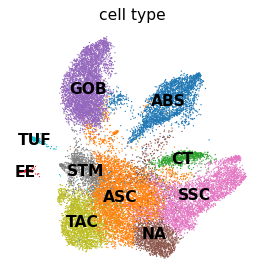

In [58]:
sc.pl.umap(adata2,color=['cell_type'],use_raw=False,cmap='tab20b',legend_loc='on data',save='celltype.png',frameon=False,title='cell type')

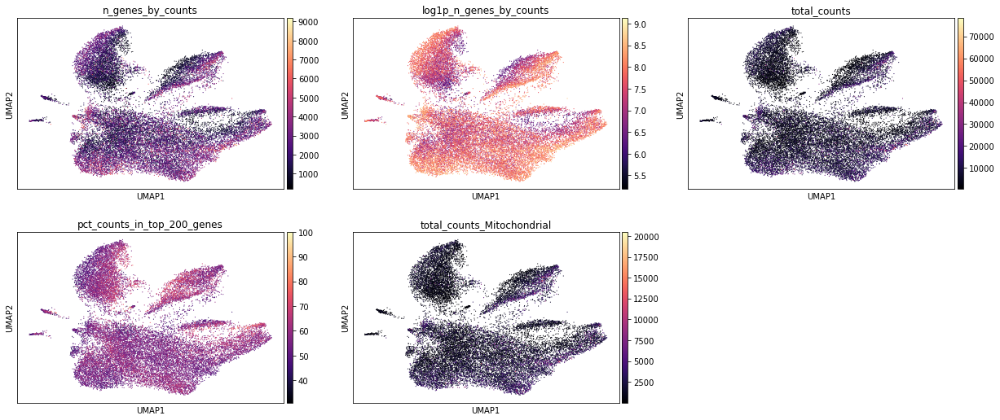

In [56]:
sc.pl.umap(adata2,color=['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts','pct_counts_in_top_200_genes','total_counts_Mitochondrial'],legend_loc='on data',legend_fontoutline=True,legend_fontsize=10,cmap='magma',ncols=3,use_raw=False)

In [57]:
marker_genes_dict_normal={
    'CT':['OTOP2','MEIS1'],
    'ABS':['KRT20','GUCA2A','ALDOB'],
    'SSC':['MSLN','MUC5AC','AQP5','TACSTD2','FSCN1','TFF2','ANXA1','ANXA10','REG4','MUC17','S100P','GSDMB','GSDMD','IL18','RELB','MDK','RARA','RXRA','AHR','AGRN','PDX1'],
    'ASC':['CLDN2','CD44','AXIN2','RNF43','TGFBI','EPHB2','TEAD2','CDX2'],
    'STM':['LGR5','OLFM4','ASCL2'],
    'TAC':['PCNA','MKI67'],
    'GOB':['ATOH1','MUC2','TFF3'],
    'EE':['CHGA','NEUROD1'],
    'TUF':['POU2F3','SOX9'],
}

nonepi_markers={
    'T':['CD8A','CD3D','CD4','TRBC2','CD96','CD247'],
    'MYE':['CSF1R','CSF3R','CD14','MRC1'],
    'MAS':['KIT','KRT1'],
    'CD19':['CD19','CD79A','CD74','HLA-DRA','CD37','CD22','MS4A1'],
    'IGH':['IGHA1','IGHA2','JCHAIN'],
    'END':['VWF','MCAM'],
    'FIB':['COL1A1','FN1'],
}


In [58]:
j = [y for x in [marker_genes_dict_normal.values()] for y in x]
flat_list_1 = [item for sublist in j for item in sublist]
flat_list_1 = [element for element in flat_list_1 if element in adata.var_names]

In [59]:
j = [y for x in [nonepi_markers.values()] for y in x]
flat_list_2 = [item for sublist in j for item in sublist]
flat_list_2 = [element for element in flat_list_2 if element in adata.var_names]

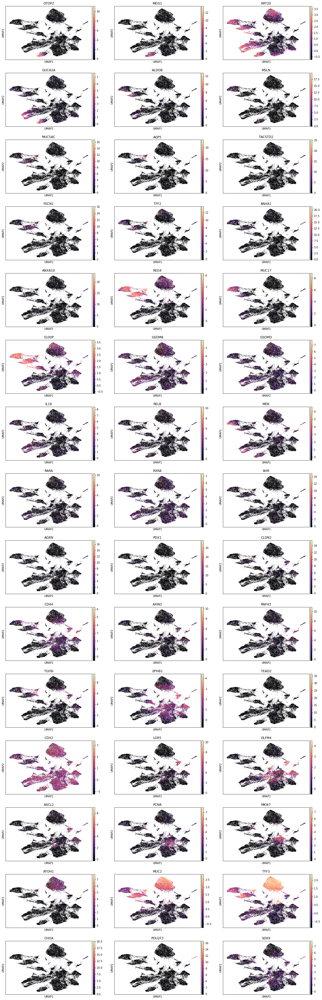

In [61]:
sc.pl.umap(adata,color=flat_list_1,legend_loc='on data',legend_fontoutline=True,legend_fontsize=10,cmap='magma',ncols=3,use_raw=False)

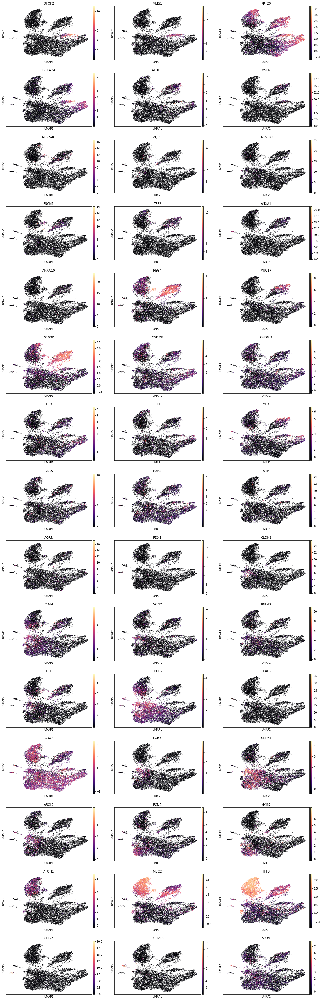

In [62]:
sc.pl.umap(adata2,color=flat_list_1,legend_loc='on data',legend_fontoutline=True,legend_fontsize=10,cmap='magma',ncols=3,use_raw=False)

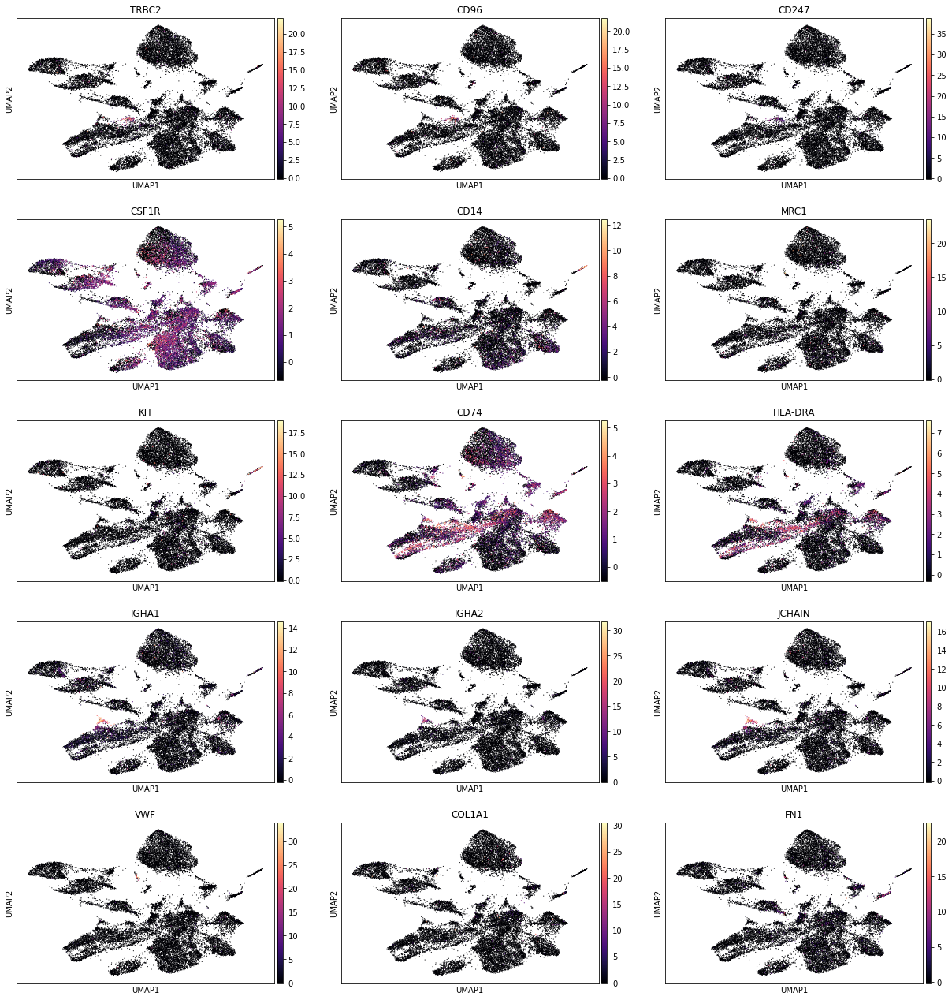

In [63]:
sc.pl.umap(adata,color=flat_list_2,legend_loc='on data',legend_fontoutline=True,legend_fontsize=10,cmap='magma',ncols=3,use_raw=False)

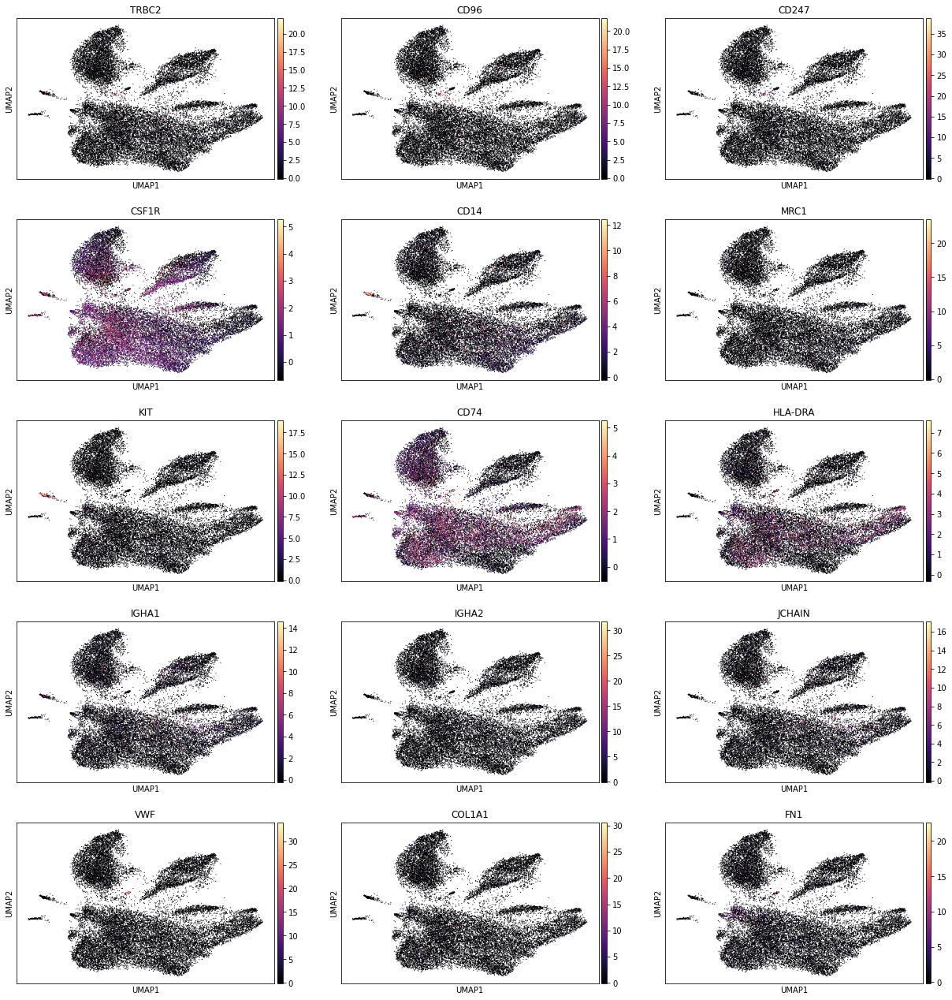

In [64]:
sc.pl.umap(adata2,color=flat_list_2,legend_loc='on data',legend_fontoutline=True,legend_fontsize=10,cmap='magma',ncols=3,use_raw=False)

### Ensemble SCENIC

In [28]:
## running the pySCENIC pipeline multiple times from CLI

In [ ]:
for i in range(10):
    RESULTS_FOLDERNAME = "/home/yilin/hopper/result"+str(i)
    os.mkdir(RESULTS_FOLDERNAME)
    METADATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.metadata.csv'.format(DATASET_ID))
    EXP_MTX_QC_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.qc.tpm.csv'.format(DATASET_ID))
    ADJACENCIES_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.adjacencies.tsv'.format(DATASET_ID))
    MOTIFS_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.motifs.csv'.format(DATASET_ID))
    REGULONS_DAT_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.regulons.dat'.format(DATASET_ID))
    filename = '/home/yilin/hopper/downsample/epi_hopper'+str(i)+'.h5ad'
    adata = sc.read_h5ad(filename)
    sc.pp.filter_genes(adata,min_cells=11)
    adata.raw = adata
    adata.to_df().to_csv(EXP_MTX_QC_FNAME)
    !pyscenic grn {EXP_MTX_QC_FNAME} {HUMAN_TFS_FNAME} -o {ADJACENCIES_FNAME} --num_workers 24
    !pyscenic ctx {ADJACENCIES_FNAME} {DBS_PARAM} \
            --annotations_fname {MOTIF_ANNOTATIONS_FNAME} \
            --expression_mtx_fname {EXP_MTX_QC_FNAME} \
            --output {MOTIFS_FNAME} \
            --num_workers 24
    df_motifs = load_motifs(MOTIFS_FNAME)
    regulons = df2regulons(df_motifs)
    with open(REGULONS_DAT_FNAME, 'wb') as f:
        pickle.dump(regulons, f)  


2021-11-16 18:39:34,433 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2021-11-16 18:39:52,492 - pyscenic.cli.pyscenic - INFO - Inferring regulatory networks.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork fro